# LOCKED POSITION RANDOMIZED DATA

FILENAME: budget_randomized.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 3-AUG-20

## PHASE 1: PROJECT SETUP

In [32]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_programs = 80
    num_of_rca = 120 # can change the amount of RCAs
    
    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    project_values = []
    subproject_values = []
    program_values = []
    rca_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['program_title'] = program_values
    raw_df['rca'] = rca_values
    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-17,subproject-25,program-65,rca-12,21871,19555.45,21765.66,21615.20,15415.23,12608.19
9991,project-18,subproject-12,program-19,rca-51,21855,15156.91,14508.22,16853.24,10961.48,9654.01
9992,project-7,subproject-2,program-66,rca-8,1814,2043.16,2163.12,1967.57,1875.91,1619.81
9993,project-9,subproject-16,program-23,rca-88,6826,8801.76,9253.78,10388.89,7660.75,7354.41
9994,project-19,subproject-31,program-66,rca-18,15929,14998.80,12932.80,8809.80,6846.85,6185.01
9995,project-10,subproject-36,program-15,rca-34,2602,1961.50,1656.95,1692.97,1283.89,1185.21
9996,project-4,subproject-15,program-65,rca-19,23402,21891.39,24498.49,19820.59,15335.68,15215.19
9997,project-14,subproject-33,program-75,rca-31,27532,23376.19,25945.26,24001.97,16586.35,16203.35
9998,project-14,subproject-13,program-77,rca-55,16581,9326.75,11060.65,13809.11,8342.18,8085.19
9999,project-8,subproject-35,program-27,rca-100,21374,11679.33,12441.32,13685.17,12320.59,10041.44


In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0         project-5-subproject-21-program-1-rca-23
1       project-11-subproject-28-program-51-rca-75
2        project-18-subproject-14-program-1-rca-96
3         project-7-subproject-4-program-31-rca-87
4       project-15-subproject-16-program-21-rca-45
                           ...                    
9995    project-10-subproject-36-program-15-rca-34
9996     project-4-subproject-15-program-65-rca-19
9997    project-14-subproject-33-program-75-rca-31
9998    project-14-subproject-13-program-77-rca-55
9999    project-8-subproject-35-program-27-rca-100
Name: key, Length: 10000, dtype: object

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                             key
9415  project-13-subproject-10-program-80-rca-26
Total count of duplicated rows :
1


In [8]:
# dropping ALL duplicte values 
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique values in data structures

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-7', 'project-3', 'project-16', 'project-9', 'project-1', 'project-11', 'project-17', 'project-10', 'project-2', 'project-4', 'project-8', 'project-19', 'project-12', 'project-6', 'project-20', 'project-13', 'project-18', 'project-15', 'project-5', 'project-14'}


In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-23', 'subproject-10', 'subproject-1', 'subproject-30', 'subproject-8', 'subproject-19', 'subproject-39', 'subproject-25', 'subproject-29', 'subproject-16', 'subproject-38', 'subproject-9', 'subproject-24', 'subproject-37', 'subproject-36', 'subproject-4', 'subproject-21', 'subproject-20', 'subproject-32', 'subproject-33', 'subproject-15', 'subproject-13', 'subproject-27', 'subproject-34', 'subproject-6', 'subproject-28', 'subproject-31', 'subproject-11', 'subproject-14', 'subproject-7', 'subproject-12', 'subproject-5', 'subproject-22', 'subproject-35', 'subproject-18', 'subproject-3', 'subproject-40', 'subproject-17', 'subproject-2', 'subproject-26'}


In [15]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-13', 'program-34', 'program-75', 'program-68', 'program-9', 'program-23', 'program-76', 'program-50', 'program-47', 'program-63', 'program-7', 'program-70', 'program-12', 'program-5', 'program-20', 'program-55', 'program-28', 'program-35', 'program-54', 'program-52', 'program-19', 'program-15', 'program-24', 'program-79', 'program-44', 'program-72', 'program-60', 'program-78', 'program-49', 'program-46', 'program-11', 'program-32', 'program-41', 'program-59', 'program-25', 'program-45', 'program-64', 'program-66', 'program-74', 'program-56', 'program-38', 'program-27', 'program-6', 'program-71', 'program-69', 'program-21', 'program-29', 'program-22', 'program-40', 'program-80', 'program-57', 'program-26', 'program-3', 'program-16', 'program-36', 'program-33', 'program-17', 'program-4', 'program-67', 'program-77', 'program-42', 'program-1', 'program-65', 'program-58', 'program-31', 'program-43', 'program-73', 'program-18', 'program-30', 'program-37', 'program-48', 'program-61'

In [16]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-55', 'rca-19', 'rca-95', 'rca-113', 'rca-102', 'rca-36', 'rca-58', 'rca-4', 'rca-3', 'rca-93', 'rca-23', 'rca-12', 'rca-96', 'rca-37', 'rca-88', 'rca-35', 'rca-69', 'rca-86', 'rca-68', 'rca-66', 'rca-80', 'rca-5', 'rca-85', 'rca-51', 'rca-103', 'rca-54', 'rca-65', 'rca-43', 'rca-84', 'rca-48', 'rca-116', 'rca-32', 'rca-8', 'rca-73', 'rca-38', 'rca-39', 'rca-11', 'rca-21', 'rca-56', 'rca-46', 'rca-79', 'rca-62', 'rca-87', 'rca-47', 'rca-101', 'rca-45', 'rca-29', 'rca-90', 'rca-28', 'rca-71', 'rca-119', 'rca-77', 'rca-57', 'rca-81', 'rca-15', 'rca-27', 'rca-107', 'rca-2', 'rca-75', 'rca-34', 'rca-26', 'rca-100', 'rca-25', 'rca-94', 'rca-1', 'rca-97', 'rca-106', 'rca-78', 'rca-108', 'rca-33', 'rca-17', 'rca-22', 'rca-99', 'rca-52', 'rca-115', 'rca-16', 'rca-60', 'rca-117', 'rca-24', 'rca-76', 'rca-31', 'rca-109', 'rca-114', 'rca-112', 'rca-14', 'rca-74', 'rca-42', 'rca-61', 'rca-44', 'rca-120', 'rca-67', 'rca-70', 'rca-6', 'rca-105', 'rca-64', 'rca-98', 'rca-83', 'rca-63', 'rca-41',

### Visualize the generated data set

Project Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name, marginal="box", # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Ordinal  Records

In [18]:

col_df = train_df[['project', 'yr-2_oblig']]

sum_df = col_df.groupby('project').sum()

sum_df

,yr-2_oblig
project,
project-1,5405994.35
project-10,5373504.33
project-11,5638992.55
project-12,5388624.81
project-13,5340134.85
project-14,5640035.56
project-15,5177370.47
project-16,5862684.03
project-17,5609042.08


In [19]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

#### Project to Subproject network graph

In [20]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-5,subproject-21
1,project-11,subproject-28
2,project-18,subproject-14
3,project-7,subproject-4
4,project-15,subproject-16
...,...,...
9995,project-10,subproject-36
9996,project-4,subproject-15
9997,project-14,subproject-33
9998,project-14,subproject-13


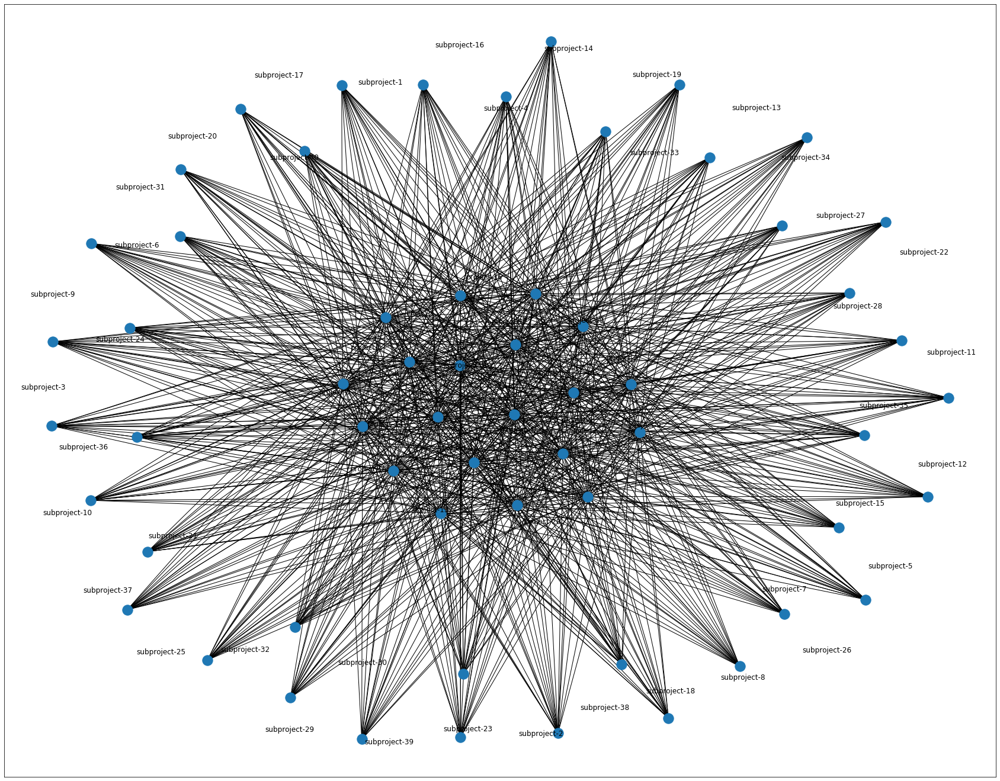

In [21]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (30,24))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [22]:
sum_df = train_df.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [23]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-21,program-1
1,subproject-28,program-51
2,subproject-14,program-1
3,subproject-4,program-31
4,subproject-16,program-21
...,...,...
9995,subproject-36,program-15
9996,subproject-15,program-65
9997,subproject-33,program-75
9998,subproject-13,program-77


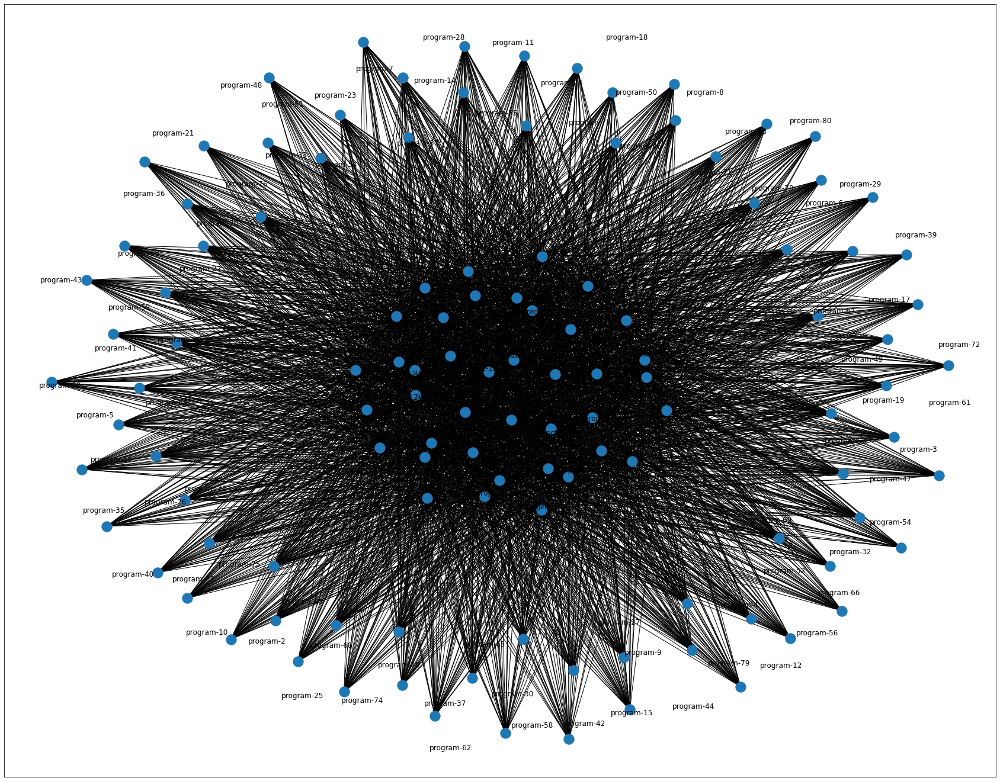

In [24]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (30,24))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

In [25]:
sum_df = train_df.groupby(['subproject', 'program_title', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['subproject', 'program_title'],value_cols='yr-2_oblig',title='Subproject to Program Title Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

In [51]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-5,subproject-21,program-1,rca-23,19650,23045.40,20511.42,19567.87,20483.12,17463.61,project-5-subproject-21-program-1-rca-23
1,project-11,subproject-28,program-51,rca-75,17247,15856.56,17496.60,19478.37,12863.77,11544.07,project-11-subproject-28-program-51-rca-75
2,project-18,subproject-14,program-1,rca-96,24695,18642.88,15518.40,18789.54,21744.03,21557.57,project-18-subproject-14-program-1-rca-96
3,project-7,subproject-4,program-31,rca-87,22213,21372.59,19044.70,11860.68,7290.11,6242.47,project-7-subproject-4-program-31-rca-87
4,project-15,subproject-16,program-21,rca-45,6174,7690.30,7575.89,5376.48,5308.42,4608.90,project-15-subproject-16-program-21-rca-45


In [52]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice.head(5)

,key,project,subproject,program_title,rca,yr0_plan
0,project-5-subproject-21-program-1-rca-23,project-5,subproject-21,program-1,rca-23,19567.87
1,project-11-subproject-28-program-51-rca-75,project-11,subproject-28,program-51,rca-75,19478.37
2,project-18-subproject-14-program-1-rca-96,project-18,subproject-14,program-1,rca-96,18789.54
3,project-7-subproject-4-program-31-rca-87,project-7,subproject-4,program-31,rca-87,11860.68
4,project-15-subproject-16-program-21-rca-45,project-15,subproject-16,program-21,rca-45,5376.48


In [53]:
exe_slice['month'] = '12'
exe_slice['day'] = '31'
exe_slice['year'] = '2019'
exe_slice['date'] = '9-30-2019'

exe_slice.head(5)

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,key,project,subproject,program_title,rca,yr0_plan,month,day,year,date
0,project-5-subproject-21-program-1-rca-23,project-5,subproject-21,program-1,rca-23,19567.87,12,31,2019,9-30-2019
1,project-11-subproject-28-program-51-rca-75,project-11,subproject-28,program-51,rca-75,19478.37,12,31,2019,9-30-2019
2,project-18-subproject-14-program-1-rca-96,project-18,subproject-14,program-1,rca-96,18789.54,12,31,2019,9-30-2019
3,project-7-subproject-4-program-31-rca-87,project-7,subproject-4,program-31,rca-87,11860.68,12,31,2019,9-30-2019
4,project-15-subproject-16-program-21-rca-45,project-15,subproject-16,program-21,rca-45,5376.48,12,31,2019,9-30-2019


Create a list of randomized obligated values for month ending 9-30-2019

In [54]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9395749464778301,
 0.9359155619890795,
 0.9857912976637507,
 0.9673378065259897,
 0.9954507534139978,
 0.9637425402591924,
 0.9019089574944449,
 0.977527185123846,
 0.9673283347831476,
 0.9676419973127598,
 0.9494758893225431,
 0.9991898551426641,
 0.9559544446388073,
 0.908891069026204,
 0.9160296069853998,
 0.965234582815421,
 0.9276060896923946,
 0.950265667658052,
 0.9064599446429179,
 0.9379151390963734,
 0.9781635184312049,
 0.973786142330787,
 0.9157909666077423,
 0.9204684893864016,
 0.9818038925262581,
 0.978278013846383,
 0.9261733826086695,
 0.9913635309793292,
 0.9323468974511924,
 0.9326315596319793,
 0.9939814322277567,
 0.9113877043753424,
 0.9846410590110011,
 0.9661690810319734,
 0.9563025971776076,
 0.9165933904990218,
 0.9320028959099557,
 0.9865844891390013,
 0.9733609691884438,
 0.9983128246082426,
 0.9043771909501639,
 0.9494138730725936,
 0.9341768508608695,
 0.9361778683264108,
 0.9721100213000262,
 0.9332937270626054,
 0.9976023723197539,
 0.9032409057877189

In [55]:
exe_slice['oblig'] = exe_slice['yr0_plan'] * eoy_oblig
exe_slice

NameError: name 'yr0_plan' is not defined

# END OF PROGRAM

"Si vacem para bellum"

# TEST SECTION

In [26]:
num_exe_proj = 15
num_exe_subproj = 30
num_exe_rca = 50
num_exe_program = 75

num_of_kc = 10
is_base = 1
is_nip = 1

In [27]:
exe_proj_list = ['proj-' + str(x) for x in range(num_exe_proj)]
exe_proj_list[:5]

['proj-0', 'proj-1', 'proj-2', 'proj-3', 'proj-4']

In [28]:
exe_subproj_list = ['subproj-' + str(x) for x in range(num_exe_subproj)]
exe_subproj_list[:5]

['subproj-0', 'subproj-1', 'subproj-2', 'subproj-3', 'subproj-4']

In [29]:
exe_rca_list = ['rca-' + str(x) for x in range(num_exe_rca)]
exe_rca_list[:5]

['rca-0', 'rca-1', 'rca-2', 'rca-3', 'rca-4']

In [30]:
exe_prog_list = ['program-' + str(x) for x in range(num_exe_program)]
exe_prog_list[:5]

['program-0', 'program-1', 'program-2', 'program-3', 'program-4']

# PHASE 4: EXPORT DATA

In [31]:
train_df.to_csv(r'locked_random_data_v1', index = False)